# Exploratory Data Analysis

In this section of the notebook, I will be exploring the data and answering the following questions:

   1. Is there something intereseting to count?
   2. Are there any trends (e.g. high, low, increasing, decreasing, anomalies)?
   3. Are there any valuable comparisons between two related quantities?
  
I used histograms, bar plots, scatterplots, and time-series plots to answer the following questions:

   4. Are there any insights from the data?
   5. Are there any correlations? 
   6. What is a hypothesis that can be taken further?
   7. What other questions arise from these insights and correlations?
   
After answering these questions, I provide a link to a presentation that uses text and plots to tell the compelling story of my data.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv
from scipy import stats
import visualization as vz
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

file = 'rainfalldata.csv'
rd = pd.read_csv(file)
file2 = 'ncrainfalldata.csv'
ncrd = pd.read_csv(file2)


In [3]:
rd.head()

,Date,"Raleigh, NC","Fayetteville, NC","Albemarle, NC","Arcola, NC","Asheboro, NC","Burlington, NC","Carthage, NC","Chapel Hill, NC","Clayton, NC",...,"ROGERSVILLE 1 NE, TN","SODDY DAISY-MOWBRAY MTN, TN","SPRING CITY, TN","TAZEWELL, TN","TOWNSEND 5S, TN","KING, NC","ABINGDON 3S, VA","WISE 1SE, VA","John Kerr Dam, VA","Emporia, VA"
0,1980-01-01,4.39,3.77,4.87,4.01,4.65,4.43,4.950000,4.08,3.57,...,5.15,5.251365,5.441905,6.06,5.487946,4.359094,4.22,4.243739,4.76,5.34
1,1980-02-01,1.91,1.77,0.84,1.29,1.55,1.82,1.210000,2.05,2.03,...,1.28,2.436904,1.940698,2.43,1.739744,1.104737,1.48,1.150000,1.45,1.27
2,1980-03-01,5.87,5.93,11.39,5.59,6.33,5.69,6.813333,6.28,5.19,...,6.50,13.298871,12.600485,7.51,10.810524,6.604737,5.84,4.320000,4.02,3.24
3,1980-04-01,1.97,3.61,3.49,1.94,1.86,2.79,2.518667,2.32,2.94,...,3.54,4.734908,4.289646,3.37,4.727123,4.352105,3.51,4.030000,3.24,2.73
4,1980-05-01,2.33,1.77,5.14,2.24,4.36,3.86,3.244000,4.50,2.30,...,2.80,4.829126,4.637170,3.79,4.585172,4.374211,4.08,2.880000,4.01,4.66


In [4]:
rd.Date = pd.to_datetime(rd.Date)
rd = rd.set_index('Date')

In [5]:
#I need to place Greensboro next to Raleigh to compare next to each other, might be able to do like 5 locations at a time. 

[1.604227832167239, 1.4892293308956817, 1.6463502057581794, 1.7502542493877853, 1.4594265443194798, 2.4302883598789364, 2.213060746979731, 2.4924109137641457, 4.090861530348652, 1.9689182926642643, 2.1188137241468716, 1.53110269957965]


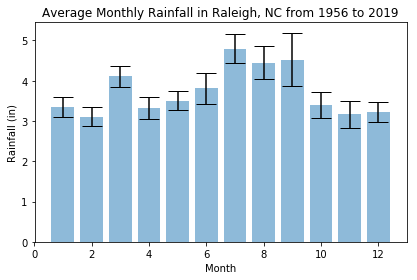

In [6]:
monthavg = []
monthsem = []
monthstd = []
for i in range(1,13):
    monthavg.append(np.mean(rd['Raleigh, NC'][rd.index.month == i]))
    monthsem.append(stats.sem(rd['Raleigh, NC'][rd.index.month == i]))
    monthstd.append(np.std(rd['Raleigh, NC'][rd.index.month == i]))
print(monthstd)
    
fig, ax = plt.subplots()
ax.bar(rd.index.month.unique(), monthavg, yerr = monthsem, alpha=0.5, ecolor='black', capsize=10)
ax.set_title('Average Monthly Rainfall in Raleigh, NC from 1956 to 2019')
ax.set_xlabel('Month')
ax.set_ylabel('Rainfall (in)')
plt.tight_layout()
plt.savefig('raleighmonthly.jpg')
plt.show()

#error bars indicate SEM

In [7]:
rdyearavg = rd.resample('Y').mean()
rdyearavg.head()

,"Raleigh, NC","Fayetteville, NC","Albemarle, NC","Arcola, NC","Asheboro, NC","Burlington, NC","Carthage, NC","Chapel Hill, NC","Clayton, NC","Dunn, NC",...,"ROGERSVILLE 1 NE, TN","SODDY DAISY-MOWBRAY MTN, TN","SPRING CITY, TN","TAZEWELL, TN","TOWNSEND 5S, TN","KING, NC","ABINGDON 3S, VA","WISE 1SE, VA","John Kerr Dam, VA","Emporia, VA"
Date,,,,,,,,,,,,,,,,,,,,,
1980-12-31,2.970000,3.840000,3.676667,2.802500,3.323333,3.900833,3.569909,3.980833,3.131111,3.403333,...,3.383333,4.120378,3.933438,3.381667,4.072633,3.393764,3.357500,3.230709,2.908737,2.849167
1981-12-31,3.031667,2.702500,4.341667,3.051667,3.629167,3.539167,3.113333,3.313333,2.915833,3.705000,...,3.518333,3.923675,3.821139,4.027500,3.902181,3.257617,3.777500,3.768333,2.835000,2.431389
1982-12-31,3.695833,3.785833,4.505000,4.022500,4.260000,4.365000,4.667500,4.786667,4.304167,4.302500,...,4.303333,5.053252,5.007462,4.714444,5.026721,3.944561,4.777500,4.174167,4.112500,3.731667
1983-12-31,3.935833,4.139167,4.105000,4.051667,3.796667,3.967500,4.242500,5.015463,4.380000,3.988333,...,3.424167,4.658825,4.384312,3.490833,4.374961,4.060439,3.410833,3.394167,4.061667,3.985000
1984-12-31,3.855833,3.815000,4.278333,4.715000,3.752500,4.038333,4.821667,4.200000,3.576875,4.560833,...,3.660278,4.690966,4.595042,4.356667,4.493751,3.942071,3.509167,3.626667,4.117500,3.645833


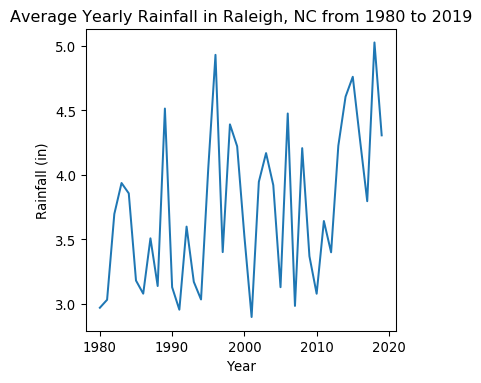

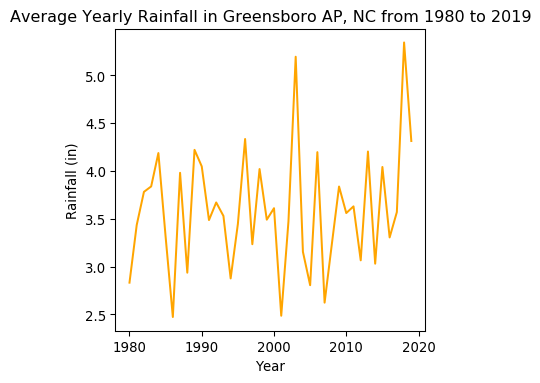

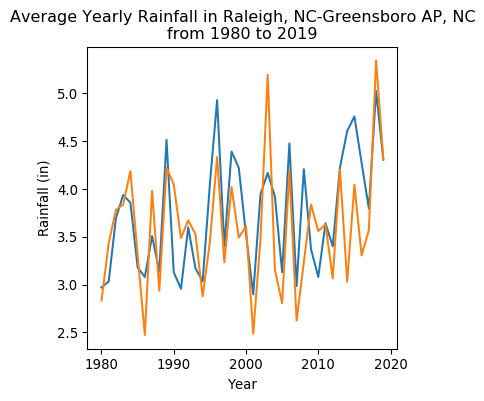

In [8]:
from textwrap import wrap
def yearlyavgfigs(df, loc, **keyword_parameters):
    plt.figure(figsize = (400/96, 400/96),dpi=96)
    if len(loc) == 1:
        if ('color' in keyword_parameters):
            plt.plot(df.index.year, df[loc[0]], keyword_parameters['color'])
        else:
            plt.plot(df.index.year, df[loc[0]])
        plt.title('Average Yearly Rainfall in ' + loc[0] + ' from 1980 to 2019')
    else:
        plt.plot(df.index.year, df[loc[0]])
        plt.plot(df.index.year, df[loc[1]])
        plt.title("\n".join(wrap('Average Yearly Rainfall in ' + loc[0] + '-' + loc[1] + ' from 1980 to 2019', 60)))
    plt.xlabel('Year')
    plt.ylabel('Rainfall (in)')
    plt.show()
yearlyavgfigs(rdyearavg, ['Raleigh, NC'])
yearlyavgfigs(rdyearavg, ['Greensboro AP, NC'], color='orange')
yearlyavgfigs(rdyearavg, ['Raleigh, NC', 'Greensboro AP, NC'])

## Seasonal Decomposition

In [9]:
plt.rcParams["figure.figsize"] = (50,50)
plt.rcParams["font.size"] = 32.0

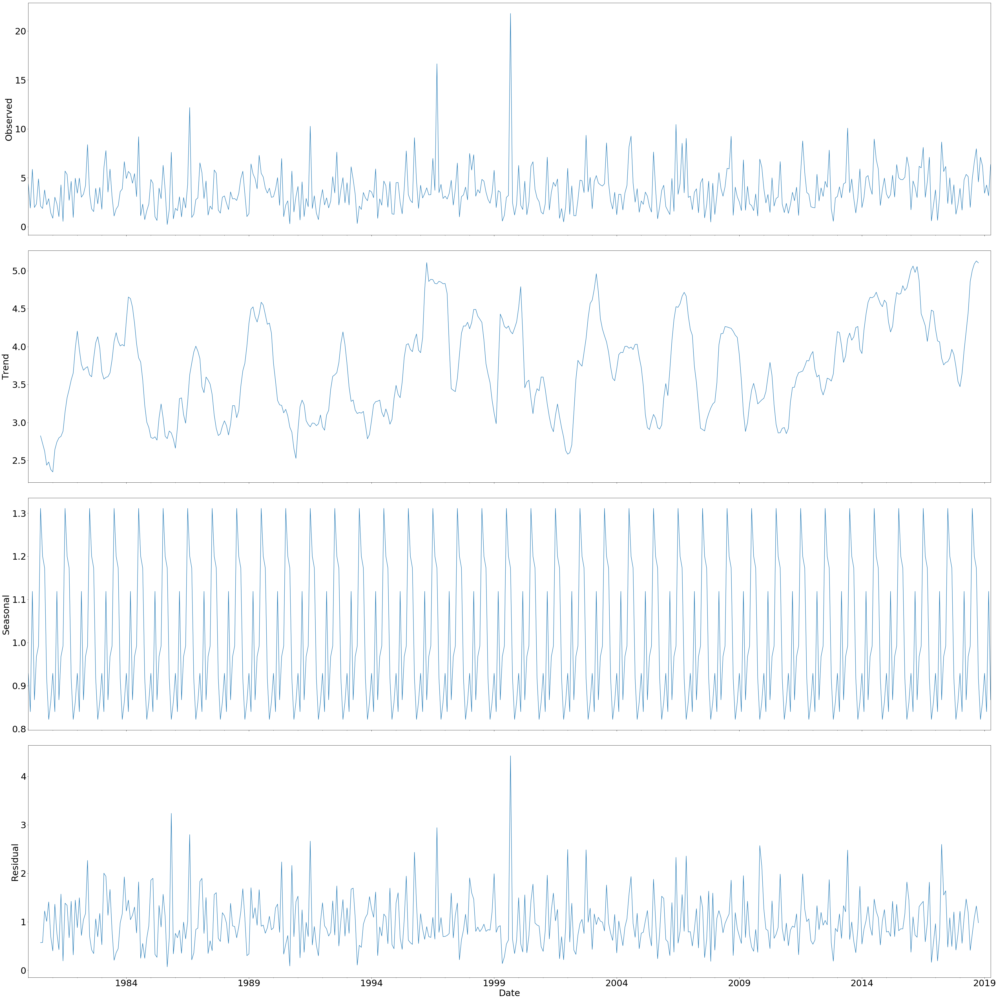

In [10]:
result = seasonal_decompose(rd['Raleigh, NC'], freq=12, model='multiplicative')
result.plot()
plt.savefig('seasonalityral.jpg')
plt.show()

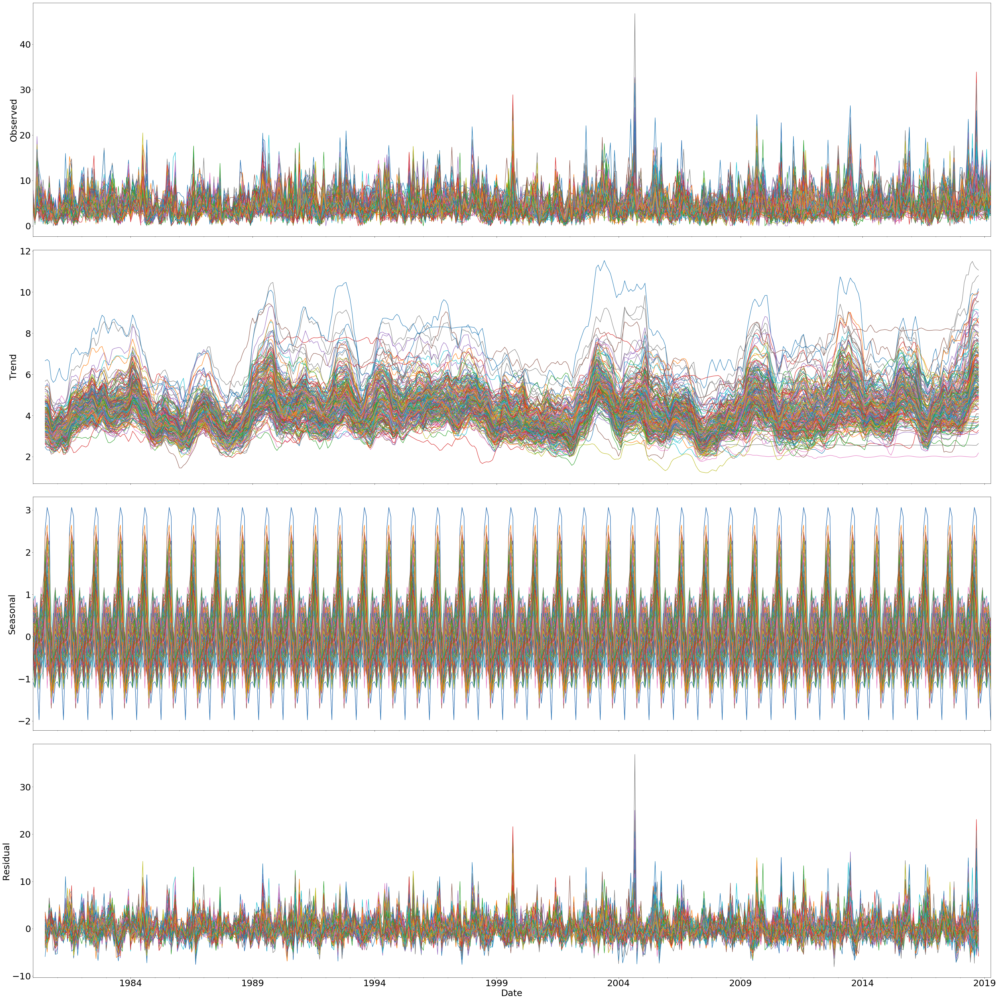

In [11]:
result = seasonal_decompose(rd, freq=12, model='additive')
result.plot()
plt.rcParams["figure.figsize"] = (50,50)
plt.show()

In [12]:
plt.rcParams["font.size"] = 12.0

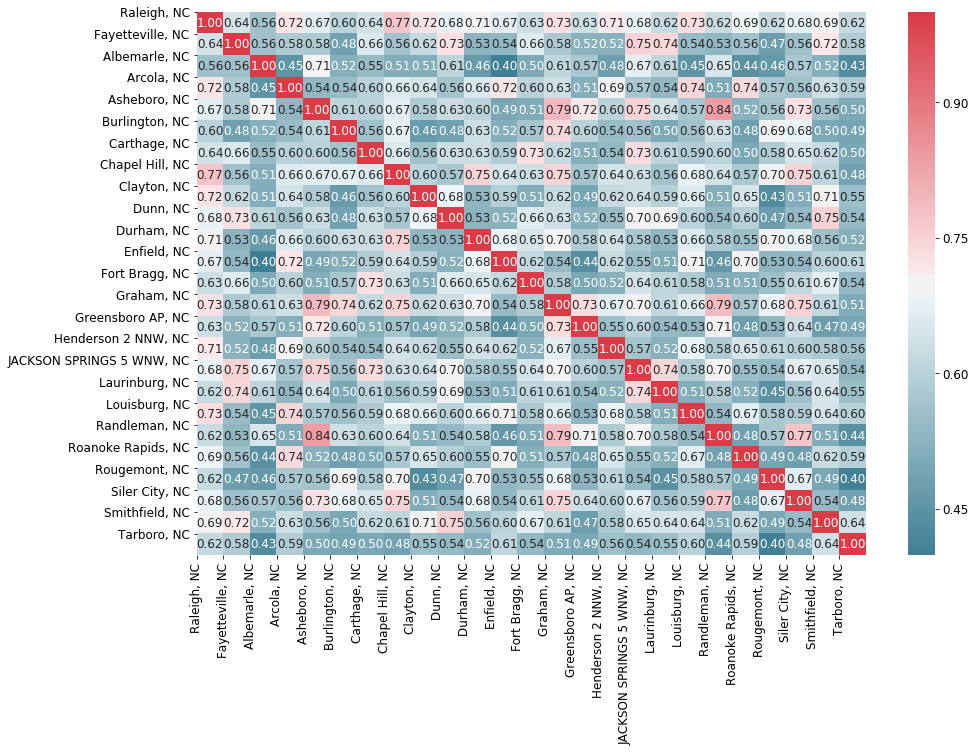

<Figure size 3600x3600 with 0 Axes>

In [13]:
#nc heatmap
rd_fr25 = rd.iloc[:,0:25]

vz.get_corr_heat_map(rd_fr25, ignore_cancelled = False)
plt.savefig('nc_heatmap.jpg')

#### Correlation
Beginning with autocorrelation of all NC locations only

In [14]:
ral = rd['Raleigh, NC']
def autocorr(x):
    result = np.correlate(x, x, mode='full')
    rs = int(result.size/2)
    return result[rs:]

In [15]:
autocorr(ral)

array([8950.24461111, 6646.95696667, 6627.02296667, 6395.48036667,
       6446.88563333, 6476.9054    , 6376.77256667, 6335.29773333,
       6364.86406667, 6404.05696667, 6436.91866667, 6551.62096667,
       6452.55226667, 6381.2043    , 6291.79066667, 6277.4919    ,
       6286.9929    , 6201.69516667, 6500.30533333, 6295.63746667,
       6400.0521    , 6253.5761    , 6358.25466667, 6302.59953333,
       6278.27646667, 6210.6371    , 6223.62133333, 6200.30776667,
       6100.22866667, 6082.07266667, 6200.8557    , 5996.0932    ,
       5963.61656667, 6164.05873333, 5973.11123333, 6097.0364    ,
       6393.7846    , 6190.95786667, 6088.5136    , 5920.4099    ,
       5939.88103333, 5923.8222    , 5856.45506667, 5755.96823333,
       5778.1392    , 5774.81523333, 5990.5612    , 6158.0979    ,
       5879.70546667, 5883.12506667, 5665.60073333, 5839.43986667,
       5609.55096667, 5453.87156667, 5613.1869    , 5549.6451    ,
       5662.1585    , 5632.7837    , 5631.12016667, 5857.9916 

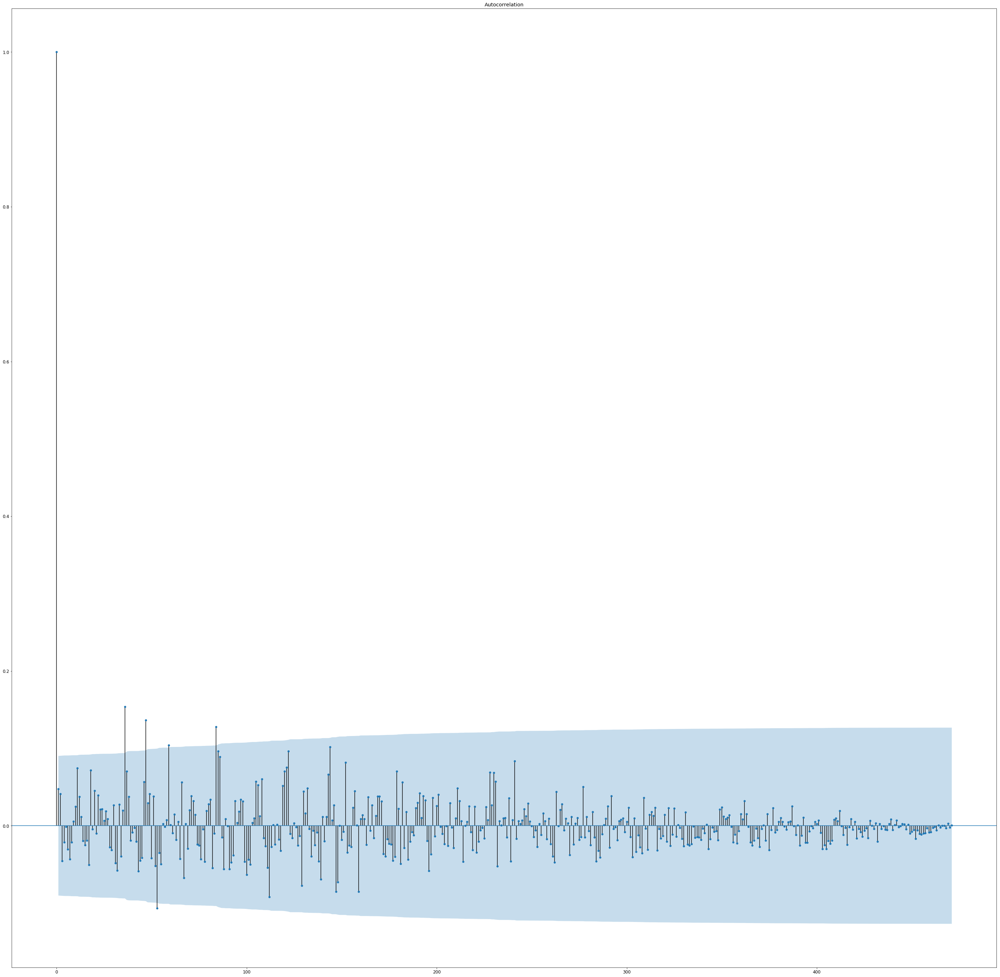

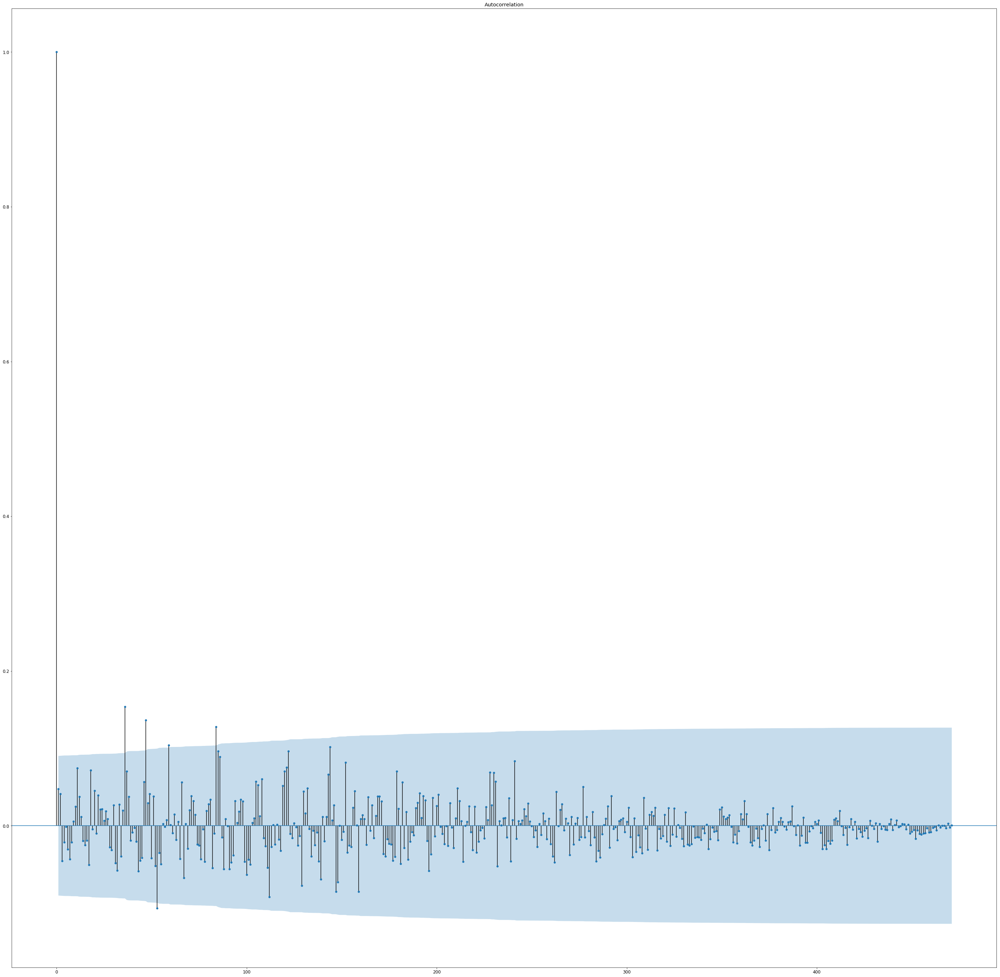

In [16]:
plot_acf(ral)

##### Correlation with lags for target variables

In [17]:
ral.autocorr(lag=12)

0.03822324093525102

In [18]:
ncrd.Date = pd.to_datetime(ncrd.Date)
ncrd = ncrd.set_index('Date')

Correlation for target variables on current months

#### Correlation of target variables with lag 1 and lag 12

In [19]:
# the following function is from https://www.kaggle.com/dedecu/cross-correlation-time-lag-with-pandas
def df_derived_by_shift(df,lag=0,NON_DER=[]):
    df = df.copy()
    if not lag:
        return df
    cols ={}
    for i in range(1,lag+1):
        for x in list(df.columns):
            if x not in NON_DER:
                if not x in cols:
                    cols[x] = ['{}_{}'.format(x, i)]
                else:
                    cols[x].append('{}_{}'.format(x, i))
    for k,v in cols.items():
        columns = v
        dfn = pd.DataFrame(data=None, columns=columns, index=df.index)    
        i = 1
        for c in columns:
            dfn[c] = df[k].shift(periods=i)
            i+=1
        df = pd.concat([df, dfn], axis=1, join_axes=[df.index])
    return df
def df_derived_by_shift_edit(df):
    lag12df = df_derived_by_shift(df, lag=12)
    lag12df = lag12df.dropna()
    corr12df = lag12df.corr()
    locs = corr12df.columns
    lag12 = locs[locs.str.endswith('_12') | locs.str.endswith('_1')]
    corr12df2 = corr12df[lag12]
    corr12df2 = corr12df2.iloc[0:len(df.columns)]
    return(corr12df2)

In [20]:
lag12df = df_derived_by_shift_edit(ncrd)

Correlation of target variables with exogenous variables lag 1 and lag 12

In [21]:
from ipynb.fs.full.Data_Wrangling_CAP1 import exofind
latlong = pd.read_csv('latlong.csv')
latlongsplit = latlong.iloc[0].apply(str.split, sep=',')
latlongdf = pd.DataFrame(latlongsplit)
latlongdf = latlongdf.drop(['Unnamed: 0','Raleigh AP, NC', 'Greensboro, NC', ' WILMINGTON 7 N, NC','LUMBERTON, NC','MYRTLE BEACH, SC','CHARLOTTE DOUGLAS AIRPORT, NC','GRNVL SPART INTL AP, SC','PICKENS, SC',' MT. MITCHELL, NC',' Caesars Head Area, SC'])


   Year  Month
0  1887      1
1  1888      1
2  1889      1
3  1890      1
4  1891      1


ipynb.fs.full.Data_Wrangling_CAP1:161: RuntimeWarning: Mean of empty slice


<class 'pandas.core.frame.DataFrame'>
Index: 472 entries, 1-1980 to 4-2019
Columns: 235 entries, Raleigh, NC to row_number
dtypes: float64(234), int64(1)
memory usage: 890.2+ KB


In [22]:
locations = rd.columns
ncloc = locations[locations.str.endswith('NC')]
valoc = locations[locations.str.endswith('VA')]
scloc = locations[locations.str.endswith('SC')]
galoc = locations[locations.str.endswith('GA')]
tnloc = locations[locations.str.endswith('TN')]
exoloc = valoc.append(galoc)
exoloc = exoloc.append(scloc)
exoloc = exoloc.append(tnloc)
exogen = exofind(latlongdf, ncloc, exoloc)

Below shows one location with its exogenous variables

In [23]:
albexo = exogen['Albemarle, NC']
albexo.append('Albemarle, NC')

In [24]:
albexodf = rd[albexo]

In [25]:
df_derived_by_shift_edit(albexodf)

,"CHESTERFIELD 3 E, SC_1","CHESTERFIELD 3 E, SC_12","CHERAW, SC_1","CHERAW, SC_12","PAGELAND 9.0 WNW, SC_1","PAGELAND 9.0 WNW, SC_12","FORT MILL 4 NW, SC_1","FORT MILL 4 NW, SC_12","Albemarle, NC_1","Albemarle, NC_12"
"CHESTERFIELD 3 E, SC",0.286104,0.262021,0.175529,0.082638,0.187642,0.096626,0.146877,0.018755,0.145053,0.074832
"CHERAW, SC",0.160359,0.157403,0.141216,0.039943,0.132817,0.065302,0.081071,0.031728,0.092226,0.071951
"PAGELAND 9.0 WNW, SC",0.187163,0.106393,0.148569,-0.009888,0.163131,0.026271,0.147195,-0.008313,0.148076,0.024914
"FORT MILL 4 NW, SC",0.152396,0.069013,0.140928,-0.013989,0.164970,0.037786,0.185718,0.033797,0.159386,0.039035
"Albemarle, NC",0.156011,0.073902,0.149791,0.004496,0.187793,0.031035,0.185940,-0.019984,0.223435,0.010365
